<a href="https://colab.research.google.com/github/geobayufd04/Geomapsbandung/blob/main/PenutupanLahan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BASIC GEOPANDAS

In [ ]:
# import library geopandas
import geopandas as gpd

# import library matplotlib
import matplotlib.pyplot as plt

In [ ]:
# import data vector kita menggunakan geopandas

AOI = gpd.read_file('/content/drive/MyDrive/Penutupan Lahan/wilayahGer_Export.shp')

In [ ]:
print(AOI)

    FID                                           geometry
0     0  POLYGON ((12.10134 50.31398, 12.101 50.31437, ...
1     1  POLYGON ((11.9053 50.41517, 11.93171 50.41692,...
2     2  POLYGON ((6.3734 50.32308, 6.3984 50.32318, 6....
3     3  POLYGON ((6.34881 49.52529, 6.35649 49.52592, ...
4     4  MULTIPOLYGON (((10.90602 53.96121, 10.90448 53...
5     5  MULTIPOLYGON (((10.32798 53.43266, 10.35051 53...
6     6  POLYGON ((8.13447 50.68404, 8.10672 50.69505, ...
7     7  POLYGON ((9.11069 49.57511, 9.11844 49.57121, ...
8     8  POLYGON ((14.70677 51.54083, 14.70658 51.54083...
9     9  MULTIPOLYGON (((10.60124 53.37183, 10.6121 53....
10   10  MULTIPOLYGON (((8.51304 53.6171, 8.51341 53.61...
11   11  POLYGON ((9.74081 53.57257, 9.74088 53.57275, ...
12   12  POLYGON ((10.05502 50.5165, 10.04898 50.5056, ...
13   13  POLYGON ((12.26455 51.08376, 12.32894 51.08784...
14   14  POLYGON ((13.06166 51.61509, 13.04383 51.61793...
15   15  POLYGON ((13.62633 52.48703, 13.66452 52.48977.

In [ ]:
AOI.head()

,FID,geometry
0,0,"POLYGON ((12.10134 50.31398, 12.101 50.31437, ..."
1,1,"POLYGON ((11.9053 50.41517, 11.93171 50.41692,..."
2,2,"POLYGON ((6.3734 50.32308, 6.3984 50.32318, 6...."
3,3,"POLYGON ((6.34881 49.52529, 6.35649 49.52592, ..."
4,4,"MULTIPOLYGON (((10.90602 53.96121, 10.90448 53..."


In [ ]:
AOI.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   FID       16 non-null     int64   
 1   geometry  16 non-null     geometry
dtypes: geometry(1), int64(1)
memory usage: 384.0 bytes


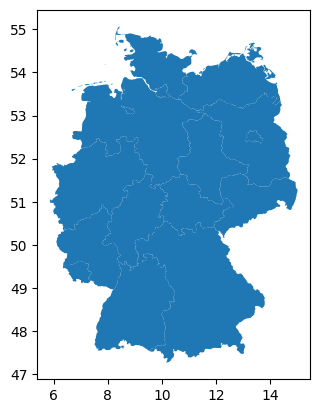

In [ ]:
# Visualisasi sederhana data vektor
AOI.plot()
plt.show()

In [ ]:
# Cek CRS dari data geopandas
AOI.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
AOI = AOI.set_crs("EPSG:4326")
# Menyimpan data shapefile
AOI.to_file("/content/drive/MyDrive/Penutupan Lahan/wilayahGer_Export.shp")

#Download Sentinel-2 Data (GEEMAP)

In [ ]:
import ee
import geemap
from ee.batch import Export

In [ ]:
!pip install pycrs

  Preparing metadata (setup.py) ... done
  Created wheel for pycrs: filename=PyCRS-1.0.2-py3-none-any.whl size=32687 sha256=3a9a93b05e3a2c20e87bf2bffe02773680f33d8d20da39c18b9f8f61a979f2d8
  Stored in directory: /root/.cache/pip/wheels/47/1d/70/7a5bdf33347e7c75e95b06b1fa38f076a59a9506653cc24aff
Successfully built pycrs


In [ ]:
# Melakukan autentikasi dan mendefinisikan Google Cloud Project yang akan digunakan
ee.Authenticate()
ee.Initialize(project='ee-geomaps12') #ganti dengan nama Google Cloud Project anda

In [ ]:
# Menambahkan basemap
m = geemap.Map()
m

In [ ]:
#memilih basemap
m.add('basemap_selector')
# Menambahkan Layer manager
m.add("layer_manager")
m

In [ ]:
# Memasukkan shapefile AOI dan mengubahnya kedalam earth engine object
AOI_ee = geemap.shp_to_ee("/content/drive/MyDrive/Penutupan Lahan/Wilayah_Ger.shp")
AOI_ee = AOI_ee.geometry()

In [ ]:
AOI_ee

In [ ]:
# Menambahkan AOI Kedalam Peta GEEMAP
m.addLayer(AOI_ee, {}, "AOI")
m.centerObject(AOI_ee, 12) #Set zoom in
m

# Sentinel-2

In [ ]:
# Membuat variable S2_Col untuk memanggil image collection Sentinel-2
S2_Col = ee.ImageCollection('COPERNICUS/S2_HARMONIZED')

In [ ]:
# Proses pemfilteran data image collection
# Pemfilteran tutupan awan ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20) (hanya memilih data yg memiliki tutupan awan dibawah 20%)
# Pemfilteran tanggal ee.Filter.date('2023-01-01', '2023-12-31') (silahkan edit rentang tanggal)
# Filter berdasarkan wilayah kajian .filter(ee.Filter.bounds(AOI))
S2_filtered = S2_Col.filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)).filter(ee.Filter.date('2024-01-01', '2024-12-31')).filter(ee.Filter.bounds(AOI_ee))
S2_filtered

Buffered data was truncated after reaching the output size limit.

In [ ]:
# Setelah kita memfilter image collection
# Langkah selanjutnya adalah membuat median composite
# Berikut kita membuat median composite dengan fungsi .median()
# Setelah itu kita melakukan apply factor skala untuk data Sentinel-2, yaitu setiap nilai piksel dibagi dengan 10000 .divide(10000)
# Selanjutnya kita memotong data image sesuai dengan area kajian kita dengan fungsi .clip(AOI)
S2_medianComposite = S2_filtered.median().divide(10000).clip(AOI_ee)
S2_medianComposite

In [ ]:
# Variable untuk visualisasi image
Vis_S2 = {
  "min": 0.0,
  "max": 0.2,
  "bands": ['B4', 'B3', 'B2'],
}

In [ ]:
# Menambahkan data image ke peta
m.addLayer(S2_medianComposite, Vis_S2, "True color (432)")
m.centerObject(AOI_ee, 12) #Set zoom in
m

In [ ]:
# Pilih band yang akan kita gunakan kedepannya.
# disini saya memilih band RED(B4), Green(B3), Blue (B2), NIR (B8), SWIR1(B11), dan SWIR2(B12)
selected_bands = S2_medianComposite.select(['B2', 'B3', 'B4', 'B8', 'B11', 'B12'])
selected_bands

In [ ]:
# Export dengan default WGS84 tanpa mendefinisikan CRS
geemap.ee_export_image_to_drive(selected_bands, description="S2_Germanny_Raster_2024", folder="S2_Germanny_Raster_2024", region=AOI_ee, scale=10, maxPixels=1e13)

# Pengolahan Raster

In [ ]:
# install Library rasterio
!pip install rasterio

In [ ]:
# Import Library rasterio
import rasterio

In [ ]:
# Membaca file raster .tif
# Sesuaikan lokasi path dari data raster yang sudah diexport dari GEE ke google drive kita
raster_file_path = '/content/drive/MyDrive/Penutupan Lahan/S2_Geosoftware_Python_Raster_2024 (1).tif'
dataset = rasterio.open(raster_file_path)

In [ ]:
# Nama image yang diinput
img_name = dataset.name
print('Image filename: {n}\n'.format(n=img_name))

In [ ]:
# Berapa banyak bands?
num_bands = dataset.count
print('Total Bands: {n}\n'.format(n=num_bands))

In [ ]:
# Deskripsi list bands pada data
desc = dataset.descriptions

print('Raster description: {desc}\n'.format(desc=desc))

In [ ]:
# Column dan row atau image size
rows, cols = dataset.shape
print('Image size: {r} rows x {c} columns\n'.format(r=rows, c=cols))

In [ ]:
# Format driver data
driver = dataset.driver
print('Raster driver: {d}\n'.format(d=driver))

In [ ]:
# Cek data projection
proj = dataset.crs
print('Image projection:')
print(proj, '\n')

In [ ]:
# Cek semua metadata
metadata = dataset.meta

print('Semua metadata:')
print(metadata)

# Visualisasi Citra Sentinel-2

In [ ]:
# Import library matplotlib untuk visualisasi data raster
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# untuk membuka semua band di data raster, kita bisa menggunakan
S2_image_all = dataset.read()
S2_image_all.shape

In [ ]:
# Bisa kita lihat, format shape dari data tersebut adalah bands, row, column
# Untuk Plot data raster dengan matplotlib, kita harus menggunakan format shape row, column,bands
# Ubah format shape menjadi row, column, bands:
S2_image_all = S2_image_all.transpose(1, 2, 0)
S2_image_all.shape

In [ ]:
# Deskripsi list bands pada data
desc = dataset.descriptions
print('Raster description: {desc}\n'.format(desc=desc))

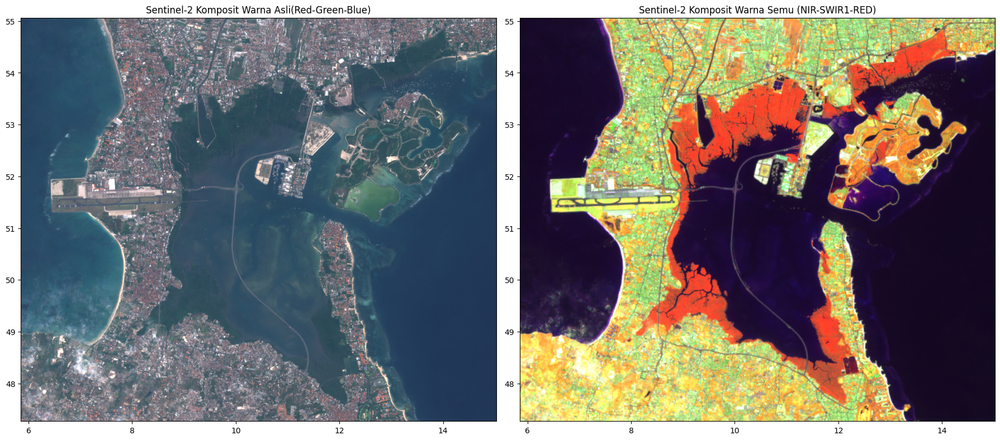

In [ ]:
# Visualisasi Komposit warna asli (B4, B3, B2) dan komposit warna semu (B8, B11, B4)

# Membuat figure untuk dua plot gambar
fig, ax = plt.subplots(1, 2, figsize=(18, 8))

# Untuk membuat visualisasi yang lebih cerah, silahkan atur brightness factor
brightness_factor = 3.5


# Original Sentinel-2 image (RGB)
rgb = np.stack((S2_image_all[:, :, 2], S2_image_all[:, :, 1], S2_image_all[:, :, 0]), axis=-1) #menggunakan stack untuk membuat komposit citra
S2_Vis_rgb = np.clip(rgb * brightness_factor, 0, 1)

ax[0].imshow(S2_Vis_rgb, extent=[AOI.total_bounds[0], AOI.total_bounds[2],AOI.total_bounds[1], AOI.total_bounds[3]])
ax[0].set_title('Sentinel-2 Komposit Warna Asli(Red-Green-Blue)')

# Komposit warna semu Sentinel-2 image (B8, B11, B4)
semu = np.stack((S2_image_all[:, :, 3], S2_image_all[:, :, 4], S2_image_all[:, :, 2]), axis=-1)
S2_Vis_semu = np.clip(semu * brightness_factor, 0, 1)

ax[1].imshow(S2_Vis_semu, extent=[AOI.total_bounds[0], AOI.total_bounds[2],AOI.total_bounds[1], AOI.total_bounds[3]])
ax[1].set_title('Sentinel-2 Komposit Warna Semu (NIR-SWIR1-RED)')

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Penutupan Lahan/VisualGermanyRaster', dpi=600)
plt.show()
